<a href="https://colab.research.google.com/github/K-Means-Necessary-INFO-3604/Cucurbit-Disease-Detection/blob/%237.4-HSV-for-Image-Segmentation---Annika/Cucurbit_Disease_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Set seeds for reproducibility
import random
random.seed(0)

import numpy as np
np.random.seed(0)

import tensorflow as tf
tf.random.set_seed(0)

In [ ]:
import os
import json
from zipfile import ZipFile
from PIL import Image

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models

In [ ]:
import math

In [ ]:
import io
import pandas as pd
from PIL import Image
from rembg import remove
import torch
import os

In [ ]:
!pip install kaggle

In [ ]:
kaggle_credentails = json.load(open("kaggle.json"))

In [ ]:
# setup Kaggle API key as environment variables
os.environ['KAGGLE_USERNAME'] = kaggle_credentails["username"]
os.environ['KAGGLE_KEY'] = kaggle_credentails["key"]

In [ ]:
!kaggle datasets download -d tahmidmir/pumpkin-leaf-diseases-dataset-from-bangladesh


Dataset URL: https://www.kaggle.com/datasets/tahmidmir/pumpkin-leaf-diseases-dataset-from-bangladesh
License(s): Attribution 4.0 International (CC BY 4.0)
pumpkin-leaf-diseases-dataset-from-bangladesh.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
!unzip pumpkin-leaf-diseases-dataset-from-bangladesh.zip -d /content/pumpkin_leaf_diseases


Archive:  pumpkin-leaf-diseases-dataset-from-bangladesh.zip
replace /content/pumpkin_leaf_diseases/Pumpkin Leaf Diseases Dataset From Bangladesh/Original Dataset/Bacterial Leaf Spot/Bacterial Leaf Spot (1).jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: /content/pumpkin_leaf_diseases/Pumpkin Leaf Diseases Dataset From Bangladesh/Original Dataset/Bacterial Leaf Spot/Bacterial Leaf Spot (1).jpg  
replace /content/pumpkin_leaf_diseases/Pumpkin Leaf Diseases Dataset From Bangladesh/Original Dataset/Bacterial Leaf Spot/Bacterial Leaf Spot (10).jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: /content/pumpkin_leaf_diseases/Pumpkin Leaf Diseases Dataset From Bangladesh/Original Dataset/Bacterial Leaf Spot/Bacterial Leaf Spot (10).jpg  
replace /content/pumpkin_leaf_diseases/Pumpkin Leaf Diseases Dataset From Bangladesh/Original Dataset/Bacterial Leaf Spot/Bacterial Leaf Spot (100).jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: /content/pumpkin_leaf_diseases/Pumpk

In [ ]:
!kaggle datasets download -d sujaykapadnis/cucumber-disease-recognition-dataset

Dataset URL: https://www.kaggle.com/datasets/sujaykapadnis/cucumber-disease-recognition-dataset
License(s): Attribution 4.0 International (CC BY 4.0)
cucumber-disease-recognition-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
!unzip cucumber-disease-recognition-dataset.zip -d /content/cucumber_disease

Streaming output truncated to the last 5000 lines.
  inflating: /content/cucumber_disease/Cucumber Disease Recognition Dataset/Augmented Image/Augmented Image/Downy Mildew/Downy Mildew (36).jpg  
  inflating: /content/cucumber_disease/Cucumber Disease Recognition Dataset/Augmented Image/Augmented Image/Downy Mildew/Downy Mildew (360).jpg  
  inflating: /content/cucumber_disease/Cucumber Disease Recognition Dataset/Augmented Image/Augmented Image/Downy Mildew/Downy Mildew (361).jpg  
  inflating: /content/cucumber_disease/Cucumber Disease Recognition Dataset/Augmented Image/Augmented Image/Downy Mildew/Downy Mildew (362).jpg  
  inflating: /content/cucumber_disease/Cucumber Disease Recognition Dataset/Augmented Image/Augmented Image/Downy Mildew/Downy Mildew (363).jpg  
  inflating: /content/cucumber_disease/Cucumber Disease Recognition Dataset/Augmented Image/Augmented Image/Downy Mildew/Downy Mildew (364).jpg  
  inflating: /content/cucumber_disease/Cucumber Disease Recognition Datase

In [ ]:
!kaggle datasets download -d sujaykapadnis/watermelon-disease-recognition-dataset


Dataset URL: https://www.kaggle.com/datasets/sujaykapadnis/watermelon-disease-recognition-dataset
License(s): Attribution 4.0 International (CC BY 4.0)
watermelon-disease-recognition-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
!unzip watermelon-disease-recognition-dataset.zip -d /content/watermelon_disease

Streaming output truncated to the last 5000 lines.
  inflating: /content/watermelon_disease/Watermelon Disease Recognition Dataset/Augmented Image/Augmented_Image/Downy_Mildew/IMG_2413_brightened.jpg  
  inflating: /content/watermelon_disease/Watermelon Disease Recognition Dataset/Augmented Image/Augmented_Image/Downy_Mildew/IMG_2413_flip.jpg  
  inflating: /content/watermelon_disease/Watermelon Disease Recognition Dataset/Augmented Image/Augmented_Image/Downy_Mildew/IMG_2413_scaled.jpg  
  inflating: /content/watermelon_disease/Watermelon Disease Recognition Dataset/Augmented Image/Augmented_Image/Downy_Mildew/IMG_2413_shifted.jpg  
  inflating: /content/watermelon_disease/Watermelon Disease Recognition Dataset/Augmented Image/Augmented_Image/Downy_Mildew/IMG_2413_zoomed.jpg  
  inflating: /content/watermelon_disease/Watermelon Disease Recognition Dataset/Augmented Image/Augmented_Image/Downy_Mildew/IMG_2414_brightened.jpg  
  inflating: /content/watermelon_disease/Watermelon Disease 

In [ ]:
#Checks if GPU is available and prints its name
import torch

if torch.cuda.is_available():
    print("GPU is available:", torch.cuda.get_device_name(0))
else:
    print("No GPU found. Change runtime type to GPU.")


GPU is available: Tesla T4


In [ ]:
# Uninstall any existing ONNX Runtime packages (both CPU and GPU versions)
# and reinstall the GPU-optimized ONNX Runtime for better performance.
!pip uninstall -y onnxruntime onnxruntime-gpu
!pip install onnxruntime-gpu


Found existing installation: onnxruntime-gpu 1.20.1
Uninstalling onnxruntime-gpu-1.20.1:
  Successfully uninstalled onnxruntime-gpu-1.20.1
  Using cached onnxruntime_gpu-1.20.1-cp311-cp311-manylinux_2_27_x86_64.manylinux_2_28_x86_64.whl.metadata (4.5 kB)
Using cached onnxruntime_gpu-1.20.1-cp311-cp311-manylinux_2_27_x86_64.manylinux_2_28_x86_64.whl (291.5 MB)


In [ ]:
import onnxruntime as ort
print("ONNX Device:", ort.get_device())


ONNX Device: GPU


In [ ]:
#Checks if a CUDA-enabled GPU is available for PyTorch
torch.cuda.is_available()

True

In [ ]:
#Verifies if NVIDIA's CUDA toolkit is properly set up
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2024 NVIDIA Corporation
Built on Thu_Jun__6_02:18:23_PDT_2024
Cuda compilation tools, release 12.5, V12.5.82
Build cuda_12.5.r12.5/compiler.34385749_0


In [ ]:
#Sets the device for computation. Ensures the code runs on GPU when it is available
device = "cuda" if torch.cuda.is_available() else "cpu"

In [ ]:
!pip install rembg onnxruntime-gpu


In [ ]:
#Imports ThreadPoolExecutor for concurrent execution of tasks using multiple threads
from concurrent.futures import ThreadPoolExecutor

In [ ]:
#Creates a new rembg session using the u2net model with GPU acceleration.
from rembg import new_session
session = new_session("u2net", providers=["CUDAExecutionProvider"]) #Ensures that the model runs on the GPU

In [ ]:
def remove_background(image_path):
    """Removes background from an image using GPU and returns it as a BytesIO object."""
    with Image.open(image_path).convert("RGBA") as img:
        img_array = np.array(img)  #Converts the image directly to numpy array

    #Process on GPU
    image_without_background = remove(img_array, session=session)

    #Convert back to BytesIO
    image_io = io.BytesIO()
    Image.fromarray(image_without_background).save(image_io, format="PNG")

    #Free unused GPU memory
    torch.cuda.empty_cache()

    return image_io

def process_images_with_background_removal(files, batch_size=4):
    """Processes multiple images in parallel with batch GPU acceleration."""
    df_results = []

    #Processes images in batches
    for i in range(0, len(files), batch_size):
        batch = files[i:i + batch_size] #Creates batches
        with ThreadPoolExecutor(max_workers=batch_size) as executor:
            results = list(executor.map(remove_background, batch))
        df_results.extend(results)

    return pd.DataFrame({"Processed Image": df_results})

In [ ]:
watermelon_downy_folder = "/content/watermelon_disease/Watermelon Disease Recognition Dataset/Original Image/Watermelon/Downy_Mildew"
watermelon_downy_files = [os.path.join(watermelon_downy_folder, filename) for filename in os.listdir(watermelon_downy_folder)]

In [ ]:
watermelon_downy_files[2]

'/content/watermelon_disease/Watermelon Disease Recognition Dataset/Original Image/Watermelon/Downy_Mildew/IMG_2268.jpg'

In [ ]:
df = process_images_with_background_removal(watermelon_downy_files)

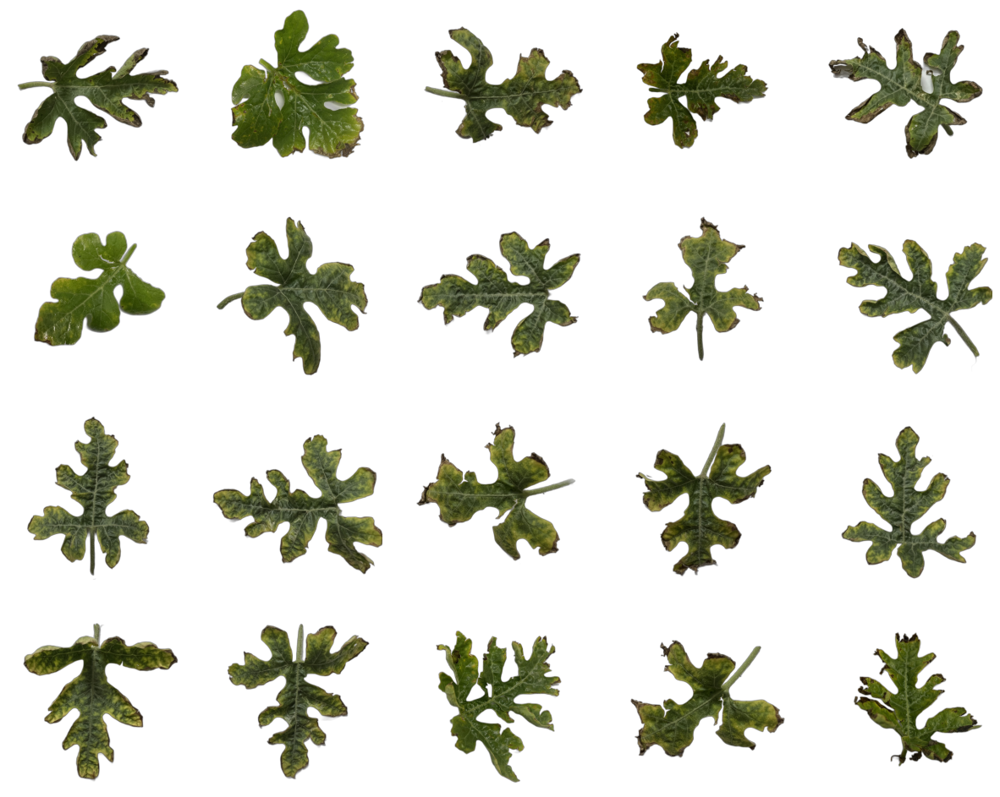

In [ ]:
#Selectd first 20 images
num_images = min(20, len(df))

#Creates a grid layout
rows, cols = 4, 5
fig, axes = plt.subplots(rows, cols, figsize=(15, 12))

#Flattens axes array for easy iteration
axes = axes.flatten()

for i in range(num_images):
    img_io = df.loc[i, "Processed Image"]  #Get BytesIO object
    img = Image.open(img_io) #Convert BytesIO to PIL Image


    axes[i].imshow(img)
    axes[i].axis("off")

#Hides unused subplots
for j in range(num_images, len(axes)):
    axes[j].axis("off")

Attempt to store files to google drive as pngs

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
folder_path = "/content/drive/MyDrive/Watermelon/DownyMildew"
os.makedirs(folder_path, exist_ok=True)

# Save images as PNG in Google Drive
for idx, row in df.iterrows():
    image = Image.open(row['Processed Image'])  # Convert BytesIO to PIL Image
    image_path = os.path.join(folder_path, f'image_{idx}.png')  # PNG format
    image.save(image_path, format="PNG")

print(f"Saved {len(df)} images to {folder_path}")

Saved 380 images to /content/drive/MyDrive/Watermelon/DownyMildew


In [ ]:
def save_images_to_drive(df, folder_path):
    """
    Takes in the dataframe with the removed backgrounds
    and folder_path for google drive as parameters
    """
    os.makedirs(folder_path, exist_ok=True) #Ensures that folder exists

    for idx, row in df.iterrows():
        image = Image.open(row['Processed Image']) #Converts BytesIO to PIL Image
        image_path = os.path.join(folder_path, f'image_{idx}.png')  #Defines image path
        image.save(image_path, format="PNG")  #Saves image

    print(f"Saved {len(df)} images to {folder_path}")

In [ ]:

def display_images(df, num_images=20):
    """
    Displays a grid of images from a DataFrame containing 'Processed Image' as BytesIO objects.

    Parameters:
        df (pd.DataFrame): DataFrame containing 'Processed Image' as BytesIO objects.
        num_images (int): Number of images to display (default: 20).
    """
    num_images = min(num_images, len(df))

    #Dynamically calculates grid size
    cols = 5 #Fixed number of columns
    rows = math.ceil(num_images / cols)  #Calculates required rows

    fig, axes = plt.subplots(rows, cols, figsize=(15, 3 * rows))
    axes = axes.flatten() #Flattens grid for easy iteration

    for i in range(num_images):
        img_io = df.loc[i, "Processed Image"]  #Gets BytesIO object
        img = Image.open(img_io)  #Converts BytesIO to PIL Image
        axes[i].imshow(img)
        axes[i].axis("off")

    #Hides any unused subplots
    for j in range(num_images, len(axes)):
        axes[j].axis("off")

    plt.show()



In [ ]:
watermelon_healthy_folder = "/content/watermelon_disease/Watermelon Disease Recognition Dataset/Original Image/Watermelon/Healthy"
watermelon_healthy_files = [os.path.join(watermelon_healthy_folder, filename) for filename in os.listdir(watermelon_healthy_folder)]
watermelon_healthy_df = process_images_with_background_removal(watermelon_healthy_files)

In [ ]:
save_images_to_drive(watermelon_healthy_df, "/content/drive/MyDrive/NoBG/Watermelon/Healthy")

Saved 205 images to /content/drive/MyDrive/NoBG/Watermelon/Healthy


In [ ]:
mosaic_folder = "/content/watermelon_disease/Watermelon Disease Recognition Dataset/Original Image/Watermelon/Mosaic_Virus"
mosaic_files = [os.path.join(mosaic_folder, filename) for filename in os.listdir(mosaic_folder)]
mosaic_df = process_images_with_background_removal(mosaic_files)

In [ ]:
save_images_to_drive(mosaic_df, "/content/drive/MyDrive/NoBG/Watermelon/Mosaic")

Saved 415 images to /content/drive/MyDrive/NoBG/Watermelon/Mosaic


In [ ]:
display_images(mosaic_df)

Watermelon - Augmented Images

In [ ]:
watermelon_downy_mildew_augmented_folder = "/content/watermelon_disease/Watermelon Disease Recognition Dataset/Augmented Image/Augmented_Image/Downy_Mildew"
watermelon_downy_mildew_augmented_files = [os.path.join(watermelon_downy_mildew_augmented_folder, filename) for filename in os.listdir(watermelon_downy_mildew_augmented_folder)]
watermelon_downy_mildew_augmented_df = process_images_with_background_removal(watermelon_downy_mildew_augmented_files)

KeyboardInterrupt: 

**Pumpkin**

In [ ]:
bacterial_leaf_spot_folder = "/content/pumpkin_leaf_diseases/Pumpkin Leaf Diseases Dataset From Bangladesh/Original Dataset/Bacterial Leaf Spot"
bacterial_leaf_spot_files = [os.path.join(bacterial_leaf_spot_folder, filename) for filename in os.listdir(bacterial_leaf_spot_folder)]
bacterial_leaf_spot_df = process_images_with_background_removal(bacterial_leaf_spot_files)

In [ ]:
save_images_to_drive(bacterial_leaf_spot_df, "/content/drive/MyDrive/NoBG/Pumpkin/BacterialLeafSpot")

Saved 400 images to /content/drive/MyDrive/NoBG/Pumpkin/BacterialLeafSpot


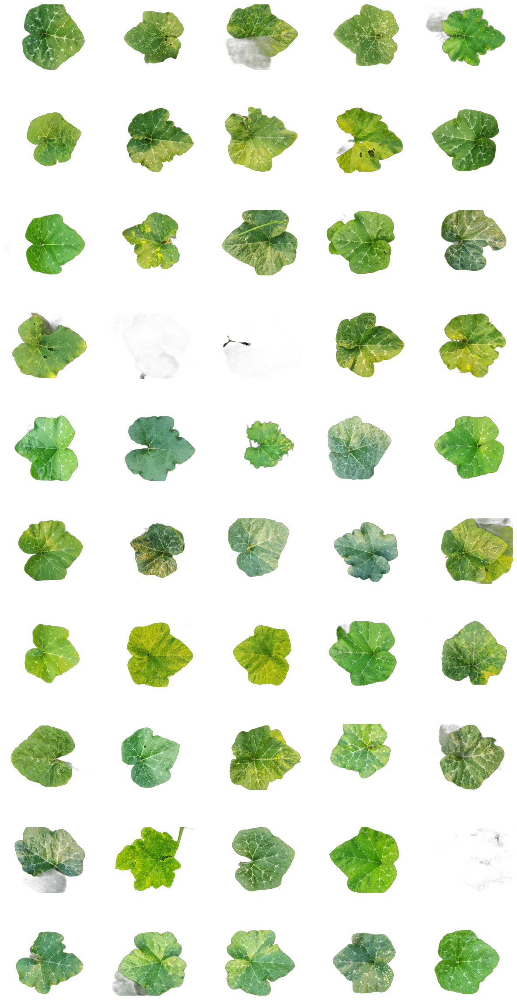

In [ ]:
display_images(bacterial_leaf_spot_df,50)

Pumpkin - Downy Mildew

In [ ]:
pumpkin_downy_mildew_folder = "/content/pumpkin_leaf_diseases/Pumpkin Leaf Diseases Dataset From Bangladesh/Original Dataset/Downy Mildew"
pumpkin_downy_mildew_files = [os.path.join(pumpkin_downy_mildew_folder, filename) for filename in os.listdir(pumpkin_downy_mildew_folder)]
pumpkin_downy_mildew_df = process_images_with_background_removal(pumpkin_downy_mildew_files)

In [ ]:
save_images_to_drive(pumpkin_downy_mildew_df, "/content/drive/MyDrive/NoBG/Pumpkin/DownyMildew")

Saved 400 images to /content/drive/MyDrive/NoBG/Pumpkin/DownyMildew


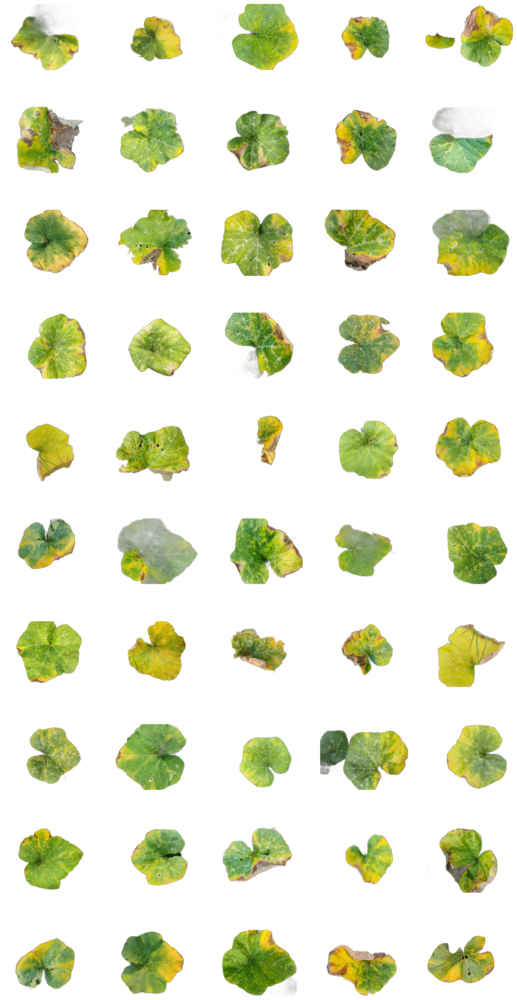

In [ ]:
display_images(pumpkin_downy_mildew_df,50)

Pumpkin - Healthy Leaf

In [ ]:
pumpkin_healthy_leaf_folder = "/content/pumpkin_leaf_diseases/Pumpkin Leaf Diseases Dataset From Bangladesh/Original Dataset/Healthy Leaf"
pumpkin_healthy_leaf_files = [os.path.join(pumpkin_healthy_leaf_folder, filename) for filename in os.listdir(pumpkin_healthy_leaf_folder)]
pumpkin_healthy_leaf_df = process_images_with_background_removal(pumpkin_healthy_leaf_files)


In [ ]:
save_images_to_drive(pumpkin_healthy_leaf_df, "/content/drive/MyDrive/NoBG/Pumpkin/HealthyLeaf")

Saved 400 images to /content/drive/MyDrive/NoBG/Pumpkin/HealthyLeaf


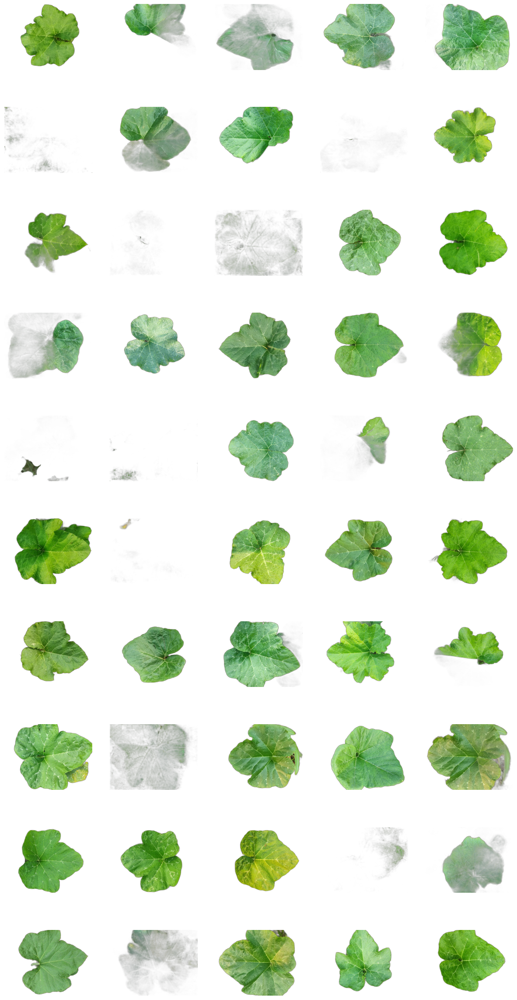

In [ ]:
display_images(pumpkin_healthy_leaf_df,50)

Pumpkin - Mosaic

In [ ]:
pumpkin_mosaic_folder = "/content/pumpkin_leaf_diseases/Pumpkin Leaf Diseases Dataset From Bangladesh/Original Dataset/Mosaic Disease"
pumpkin_mosaic_files = [os.path.join(pumpkin_mosaic_folder, filename) for filename in os.listdir(pumpkin_mosaic_folder)]
pumpkin_mosaic_df = process_images_with_background_removal(pumpkin_mosaic_files)


In [ ]:
save_images_to_drive(pumpkin_mosaic_df, "/content/drive/MyDrive/NoBG/Pumpkin/Mosaic")

Saved 400 images to /content/drive/MyDrive/NoBG/Pumpkin/Mosaic


Pumpkin - Powdery Mildew

In [ ]:
pumpkin_powdery_mildew_folder = "/content/pumpkin_leaf_diseases/Pumpkin Leaf Diseases Dataset From Bangladesh/Original Dataset/Powdery_Mildew"
pumpkin_powdery_mildew_files = [os.path.join(pumpkin_powdery_mildew_folder, filename) for filename in os.listdir(pumpkin_powdery_mildew_folder)]
pumpkin_powdery_mildew_df = process_images_with_background_removal(pumpkin_powdery_mildew_files)


In [ ]:
save_images_to_drive(pumpkin_powdery_mildew_df, "/content/drive/MyDrive/NoBG/Pumpkin/PowderyMildew")

Saved 400 images to /content/drive/MyDrive/NoBG/Pumpkin/PowderyMildew


#Cucumber

Cucumber - Anthracnose

In [ ]:
cucumber_anthracnose_folder = "/content/cucumber_disease/Cucumber Disease Recognition Dataset/Original Image/Original Image/Anthracnose"
cucumber_anthracnose_files = [os.path.join(cucumber_anthracnose_folder, filename) for filename in os.listdir(cucumber_anthracnose_folder)]
cucumber_anthracnose_df = process_images_with_background_removal(cucumber_anthracnose_files)
#display_images(cucumber_anthracnose_df,50)


In [ ]:
save_images_to_drive(cucumber_anthracnose_df, "/content/drive/MyDrive/NoBG/Cucumber/Anthracnose")

Saved 160 images to /content/drive/MyDrive/NoBG/Cucumber/Anthracnose


Cucumber - Bacterial Wilt

In [ ]:
cucumber_bacterial_wilt_folder = "/content/cucumber_disease/Cucumber Disease Recognition Dataset/Original Image/Original Image/Bacterial Wilt"
cucumber_bacterial_wilt_files = [os.path.join(cucumber_bacterial_wilt_folder, filename) for filename in os.listdir(cucumber_bacterial_wilt_folder)]
cucumber_bacterial_wilt_df = process_images_with_background_removal(cucumber_bacterial_wilt_files)
#display_images(cucumber_bacterial_wilt_df,50)


In [ ]:
save_images_to_drive(cucumber_bacterial_wilt_df, "/content/drive/MyDrive/NoBG/Cucumber/BacterialWilt")

Saved 160 images to /content/drive/MyDrive/NoBG/Cucumber/BacterialWilt


Cucumber - Downy Mildew

In [ ]:
cucumber_downy_mildew_folder = "/content/cucumber_disease/Cucumber Disease Recognition Dataset/Original Image/Original Image/Downy Mildew"
cucumber_downy_mildew_files = [os.path.join(cucumber_downy_mildew_folder, filename) for filename in os.listdir(cucumber_downy_mildew_folder)]
cucumber_downy_mildew_df = process_images_with_background_removal(cucumber_downy_mildew_files)
#display_images(cucumber_downy_mildew_df,50)

In [ ]:
save_images_to_drive(cucumber_downy_mildew_df, "/content/drive/MyDrive/NoBG/Cucumber/DownyMildew")

Saved 160 images to /content/drive/MyDrive/NoBG/Cucumber/DownyMildew


In [ ]:
cucumber_healthy_folder = '/content/cucumber_disease/Cucumber Disease Recognition Dataset/Original Image/Original Image/Fresh Leaf'
cucumber_healthy_files = [os.path.join(cucumber_healthy_folder, filename) for filename in os.listdir(cucumber_healthy_folder)]
cucumber_healthy_df = process_images_with_background_removal(cucumber_healthy_files)
#display_images(cucumber_healthy_df,50)

In [ ]:
save_images_to_drive(cucumber_healthy_df, "/content/drive/MyDrive/NoBG/Cucumber/Healthy")

Saved 160 images to /content/drive/MyDrive/NoBG/Cucumber/Healthy


In [ ]:
cucumber_gummy_stem_blight_folder = '/content/cucumber_disease/Cucumber Disease Recognition Dataset/Original Image/Original Image/Gummy Stem Blight'
cucumber_gummy_stem_blight_files = [os.path.join(cucumber_gummy_stem_blight_folder, filename) for filename in os.listdir(cucumber_gummy_stem_blight_folder)]
cucumber_gummy_stem_blight_df = process_images_with_background_removal(cucumber_gummy_stem_blight_files)
#display_images(cucumber_gummy_stem_blight_df,50)

In [ ]:
save_images_to_drive(cucumber_gummy_stem_blight_df, "/content/drive/MyDrive/NoBG/Cucumber/GummyStemBlight")

Saved 160 images to /content/drive/MyDrive/NoBG/Cucumber/GummyStemBlight


In [ ]:
# """For creating a backup of images with removed backgrounds
# """
# import shutil


# source_folder = "/content/drive/MyDrive/NoBG/"
# backup_folder = "/content/drive/My Drive/Backups/NoBG"

# #Copy the entire folder to Google Drive
# shutil.copytree(source_folder, backup_folder, dirs_exist_ok=True)

# print("Backup complete!")

Backup complete!


# Augmentation

In [ ]:
#Rotation, flipping and shifting will be done to all cucumber images

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import os
import numpy as np
import albumentations as A
from tqdm import tqdm
from PIL import Image

#Directory where the cucumber images are after background removal
root_folder = "/content/drive/MyDrive/NoBG/Cucumber"

#New root folder for augmented images
augmented_root = "/content/drive/MyDrive/Augmented"
os.makedirs(augmented_root, exist_ok=True)#Ensures that "Augmented" folder exists

#Define augmentations (applied to both RGB and alpha)
augmentations = {
    "Rotate": A.Rotate(limit=180, p=1.0),
    "HorizontalFlip": A.HorizontalFlip(p=1.0),
    "VerticalFlip": A.VerticalFlip(p=1.0),
    "ScaleShift": A.ShiftScaleRotate(shift_limit=0.2, scale_limit=0.2, rotate_limit=0, p=1.0)
}

def read_image_with_alpha(image_path):
    """Reads an image in RGBA format while preserving transparency"""
    try:
        image = Image.open(image_path).convert("RGBA") # Ensures RGBA format
        return np.array(image)
    except Exception as e:
        print(f"Error reading {image_path}: {e}")
        return None

def apply_augmentation(image_array, aug):
    """Applies augmentation to both RGB and alpha channels"""
    image_rgb = image_array[:, :, :3]  #Extract RGB
    alpha_channel = image_array[:, :, 3]  #Extract Alpha

    #Stack RGB and alpha as separate channels (needed for augmentation)
    combined = np.dstack((image_rgb, alpha_channel))

    #Apply the same transformation to both RGB and alpha channels
    augmented = aug(image=combined)["image"]

    return augmented

def save_image(image_array, save_path):
    """Saves an image while preserving the original PNG format"""
    img_pil = Image.fromarray(image_array, mode="RGBA")
    img_pil.save(save_path, format="PNG")

#Processes each disease folder
for disease_name in os.listdir(root_folder):
    disease_folder = os.path.join(root_folder, disease_name)

    if os.path.isdir(disease_folder):  #Ensures that it's a folder
        print(f"\nProcessing folder: {disease_name}")

        #Creates subfolder in "Augmented" directory
        augmented_folder = os.path.join(augmented_root, disease_name)
        os.makedirs(augmented_folder, exist_ok=True)  #Ensures that subfolder exists

        for file_name in tqdm(os.listdir(disease_folder), desc=f"Augmenting {disease_name}"):
            if file_name.endswith(".png"):
                image_path = os.path.join(disease_folder, file_name)

                #Reads image while preserving transparency
                image = read_image_with_alpha(image_path)
                if image is None:
                    continue  #Skips unreadable images

                #Applies augmentations and save images
                for aug_name, aug in augmentations.items():
                    augmented_image = apply_augmentation(image, aug)

                    #Creates a new filename with augmentation name
                    new_filename = f"{os.path.splitext(file_name)[0]}_{aug_name}.png"
                    save_path = os.path.join(augmented_folder, new_filename)

                    #Saves augmented image
                    save_image(augmented_image, save_path)

print("\nAll augmented images have been saved in the separate 'Augmented' folder, organized by disease type!") #Confirmation message to ensure completion



Processing folder: Anthracnose


Augmenting Anthracnose: 100%|██████████| 37/37 [04:00<00:00,  6.50s/it]



Processing folder: BacterialWilt


Augmenting BacterialWilt: 100%|██████████| 43/43 [02:04<00:00,  2.89s/it]



Processing folder: DownyMildew


Augmenting DownyMildew: 100%|██████████| 22/22 [02:27<00:00,  6.73s/it]



Processing folder: Healthy


Augmenting Healthy: 100%|██████████| 50/50 [04:39<00:00,  5.59s/it]



Processing folder: GummyStemBlight


Augmenting GummyStemBlight: 100%|██████████| 90/90 [09:47<00:00,  6.53s/it]


All augmented images have been saved in the separate 'Augmented' folder, organized by disease type!


# **Segmentation of Diseased Region**

TESTING THE SEGMENTATION ALGORITHM, SHADOW REMOVAL AND THE SEVERITY RATIO

Diseased Pixels: 21780
Total Leaf Pixels: 50795
Severity Ratio: 42.87823604685501%


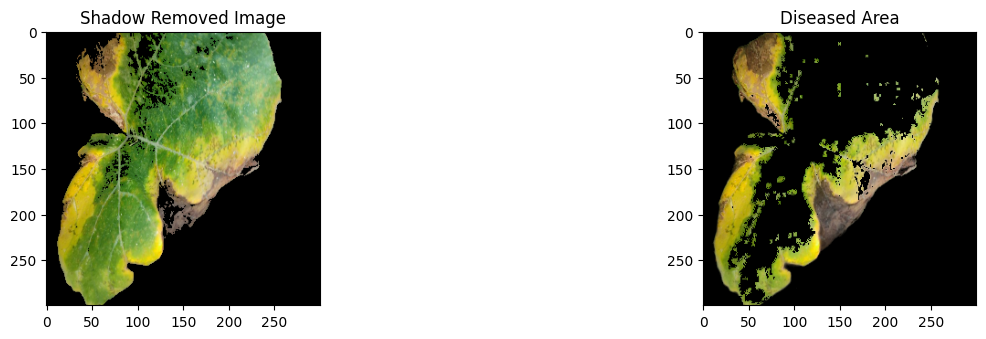

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image_path = 'image_8.png'  # Specify the image path

# Load the image
image = cv2.imread(image_path)  # Read the image from the given path
if image is None:
    print(f"Image not found at {image_path}")
else:
    # Convert from BGR to RGB
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Resize for consistency
    image_resized = cv2.resize(image_rgb, (300, 300))

    # Convert to HSV color space
    hsv = cv2.cvtColor(image_resized, cv2.COLOR_RGB2HSV)

    ### --- SHADOW REMOVAL --- ###
    lower_shadow = np.array([0, 0, 0])      # Lower bound for shadow detection
    upper_shadow = np.array([180, 255, 100])  # Upper bound for shadow detection
    shadow_mask = cv2.inRange(hsv, lower_shadow, upper_shadow)
    image_no_shadow = cv2.bitwise_and(image_resized, image_resized, mask=~shadow_mask)

    ### --- MASK CREATION --- ###
    lower_yellow = np.array([15, 100, 50])
    upper_yellow = np.array([35, 255, 255])
    yellow_mask = cv2.inRange(hsv, lower_yellow, upper_yellow)

    lower_brown = np.array([2, 3, 10])
    upper_brown = np.array([38, 255, 200])
    brown_mask = cv2.inRange(hsv, lower_brown, upper_brown)

    # Prioritize brown and yellow first
    diseased_mask = cv2.bitwise_or(yellow_mask, brown_mask)

    # Apply dilation to slightly expand diseased areas
    kernel = np.ones((3, 3), np.uint8)  # Small kernel for minimal expansion
    diseased_mask_expanded = cv2.dilate(diseased_mask, kernel, iterations=1)

    # Mask green but only near diseased regions
    lower_green = np.array([40, 100, 50])
    upper_green = np.array([70, 255, 255])
    green_mask = cv2.inRange(hsv, lower_green, upper_green)
    green_near_disease = cv2.bitwise_and(green_mask, diseased_mask_expanded)

    # Add only a small padding of green near diseased parts
    diseased_mask = cv2.bitwise_or(diseased_mask, green_near_disease)

    diseased_only = np.zeros_like(image_resized)
    diseased_only[diseased_mask != 0] = image_resized[diseased_mask != 0]

    # Calculate diseased pixels
    diseased_pixels = np.count_nonzero(np.all(diseased_only != 0, axis=-1))

    # **Refined total leaf pixels calculation (excluding black background)**
    # Mask non-black regions (i.e., non-zero pixels in the image)
    leaf_mask = np.all(image_resized != [0, 0, 0], axis=-1)  # Non-black background
    total_leaf_pixels = np.count_nonzero(leaf_mask)

    # Calculate severity ratio (as percentage)
    severity_ratio = (diseased_pixels / total_leaf_pixels) * 100 if total_leaf_pixels > 0 else 0

    print(f"Diseased Pixels: {diseased_pixels}")
    print(f"Total Leaf Pixels: {total_leaf_pixels}")
    print(f"Severity Ratio: {severity_ratio}%")

    ### --- DISPLAY RESULTS --- ###
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(image_no_shadow)
    plt.title("Shadow Removed Image")

    plt.subplot(1, 3, 3)
    plt.imshow(diseased_only)
    plt.title("Diseased Area")

    plt.show()

Now that we have tested the segmentation algorithm, shadow removal and severity ratio, this code will be applied to each folder of background removed images

**Mounting Drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# **PUMPKIN:** Downy Mildew

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Define input and output folders
input_folder = '/content/drive/MyDrive/NoBG/Pumpkin/DownyMildew'
output_folder = '/content/drive/MyDrive/DiseasedAreasSegmented/Pumpkin/Downy_Mildew'

# Ensure output folder exists
os.makedirs(output_folder, exist_ok=True)

# Process all images in the input folder
for filename in os.listdir(input_folder):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        image_path = os.path.join(input_folder, filename)
        image = cv2.imread(image_path)
        if image is None:
            print(f"Image not found: {image_path}")
            continue

        # Convert from BGR to RGB
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Resize for consistency
        image_resized = cv2.resize(image_rgb, (300, 300))

        # Convert to HSV color space
        hsv = cv2.cvtColor(image_resized, cv2.COLOR_RGB2HSV)

        # Shadow Removal
        lower_shadow = np.array([0, 0, 0])
        upper_shadow = np.array([180, 255, 100])
        shadow_mask = cv2.inRange(hsv, lower_shadow, upper_shadow)
        image_no_shadow = cv2.bitwise_and(image_resized, image_resized, mask=~shadow_mask)

        # Mask Creation
        lower_yellow = np.array([15, 100, 50])
        upper_yellow = np.array([35, 255, 255])
        yellow_mask = cv2.inRange(hsv, lower_yellow, upper_yellow)

        lower_brown = np.array([2, 3, 10])
        upper_brown = np.array([38, 255, 200])
        brown_mask = cv2.inRange(hsv, lower_brown, upper_brown)

        diseased_mask = cv2.bitwise_or(yellow_mask, brown_mask)
        kernel = np.ones((3, 3), np.uint8)
        diseased_mask_expanded = cv2.dilate(diseased_mask, kernel, iterations=1)

        lower_green = np.array([40, 100, 50])
        upper_green = np.array([70, 255, 255])
        green_mask = cv2.inRange(hsv, lower_green, upper_green)
        green_near_disease = cv2.bitwise_and(green_mask, diseased_mask_expanded)

        diseased_mask = cv2.bitwise_or(diseased_mask, green_near_disease)
        diseased_only = np.zeros_like(image_resized)
        diseased_only[diseased_mask != 0] = image_resized[diseased_mask != 0]

        # Save results
        base_name = os.path.splitext(filename)[0]
        cv2.imwrite(os.path.join(output_folder, f"{base_name}_diseased.png"), cv2.cvtColor(diseased_only, cv2.COLOR_RGB2BGR))

        print(f"Processed and saved: {filename}")

# **PUMPKIN:** Mosaic

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Define input and output folders
input_folder = '/content/drive/MyDrive/NoBG/Pumpkin/Mosaic'
output_folder = '/content/drive/MyDrive/DiseasedAreasSegmented/Pumpkin/Mosaic'

# Ensure output folder exists
os.makedirs(output_folder, exist_ok=True)

# Process all images in the input folder
for filename in os.listdir(input_folder):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        image_path = os.path.join(input_folder, filename)
        image = cv2.imread(image_path)
        if image is None:
            print(f"Image not found: {image_path}")
            continue

        # Convert from BGR to RGB
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Resize for consistency
        image_resized = cv2.resize(image_rgb, (300, 300))

        # Convert to HSV color space
        hsv = cv2.cvtColor(image_resized, cv2.COLOR_RGB2HSV)

        # Shadow Removal
        lower_shadow = np.array([0, 0, 0])
        upper_shadow = np.array([180, 255, 100])
        shadow_mask = cv2.inRange(hsv, lower_shadow, upper_shadow)
        image_no_shadow = cv2.bitwise_and(image_resized, image_resized, mask=~shadow_mask)

        # Mask Creation
        lower_yellow = np.array([15, 100, 50])
        upper_yellow = np.array([35, 255, 255])
        yellow_mask = cv2.inRange(hsv, lower_yellow, upper_yellow)

        lower_brown = np.array([2, 3, 10])
        upper_brown = np.array([38, 255, 200])
        brown_mask = cv2.inRange(hsv, lower_brown, upper_brown)

        diseased_mask = cv2.bitwise_or(yellow_mask, brown_mask)
        kernel = np.ones((3, 3), np.uint8)
        diseased_mask_expanded = cv2.dilate(diseased_mask, kernel, iterations=1)

        lower_green = np.array([40, 100, 50])
        upper_green = np.array([70, 255, 255])
        green_mask = cv2.inRange(hsv, lower_green, upper_green)
        green_near_disease = cv2.bitwise_and(green_mask, diseased_mask_expanded)

        diseased_mask = cv2.bitwise_or(diseased_mask, green_near_disease)
        diseased_only = np.zeros_like(image_resized)
        diseased_only[diseased_mask != 0] = image_resized[diseased_mask != 0]

        # Save results
        base_name = os.path.splitext(filename)[0]
        cv2.imwrite(os.path.join(output_folder, f"{base_name}_diseased.png"), cv2.cvtColor(diseased_only, cv2.COLOR_RGB2BGR))

        print(f"Processed and saved: {filename}")

# **PUMPKIN:** Powdery Mildew

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Define input and output folders
input_folder = '/content/drive/MyDrive/NoBG/Pumpkin/PowderyMildew'
output_folder = '/content/drive/MyDrive/DiseasedAreasSegmented/Pumpkin/Powdery_Mildew'

# Ensure output folder exists
os.makedirs(output_folder, exist_ok=True)

# Process all images in the input folder
for filename in os.listdir(input_folder):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        image_path = os.path.join(input_folder, filename)
        image = cv2.imread(image_path)
        if image is None:
            print(f"Image not found: {image_path}")
            continue

        # Convert from BGR to RGB
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Resize for consistency
        image_resized = cv2.resize(image_rgb, (300, 300))

        # Convert to HSV color space
        hsv = cv2.cvtColor(image_resized, cv2.COLOR_RGB2HSV)

        # Shadow Removal
        lower_shadow = np.array([0, 0, 0])
        upper_shadow = np.array([180, 255, 100])
        shadow_mask = cv2.inRange(hsv, lower_shadow, upper_shadow)
        image_no_shadow = cv2.bitwise_and(image_resized, image_resized, mask=~shadow_mask)

        # Mask Creation
        lower_yellow = np.array([15, 100, 50])
        upper_yellow = np.array([35, 255, 255])
        yellow_mask = cv2.inRange(hsv, lower_yellow, upper_yellow)

        lower_brown = np.array([2, 3, 10])
        upper_brown = np.array([38, 255, 200])
        brown_mask = cv2.inRange(hsv, lower_brown, upper_brown)

        diseased_mask = cv2.bitwise_or(yellow_mask, brown_mask)
        kernel = np.ones((3, 3), np.uint8)
        diseased_mask_expanded = cv2.dilate(diseased_mask, kernel, iterations=1)

        lower_green = np.array([40, 100, 50])
        upper_green = np.array([70, 255, 255])
        green_mask = cv2.inRange(hsv, lower_green, upper_green)
        green_near_disease = cv2.bitwise_and(green_mask, diseased_mask_expanded)

        diseased_mask = cv2.bitwise_or(diseased_mask, green_near_disease)
        diseased_only = np.zeros_like(image_resized)
        diseased_only[diseased_mask != 0] = image_resized[diseased_mask != 0]

        # Save results
        base_name = os.path.splitext(filename)[0]
        cv2.imwrite(os.path.join(output_folder, f"{base_name}_diseased.png"), cv2.cvtColor(diseased_only, cv2.COLOR_RGB2BGR))

        print(f"Processed and saved: {filename}")

#**PUMPKIN:** Bacterial Leaf Spot

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Define input and output folders
input_folder = '/content/drive/MyDrive/NoBG/Pumpkin/BacterialLeafSpot'
output_folder = '/content/drive/MyDrive/DiseasedAreasSegmented/Pumpkin/Bacterial_Leaf_Spot'

# Ensure output folder exists
os.makedirs(output_folder, exist_ok=True)

# Process all images in the input folder
for filename in os.listdir(input_folder):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        image_path = os.path.join(input_folder, filename)
        image = cv2.imread(image_path)
        if image is None:
            print(f"Image not found: {image_path}")
            continue

        # Convert from BGR to RGB
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Resize for consistency
        image_resized = cv2.resize(image_rgb, (300, 300))

        # Convert to HSV color space
        hsv = cv2.cvtColor(image_resized, cv2.COLOR_RGB2HSV)

        # Shadow Removal
        lower_shadow = np.array([0, 0, 0])
        upper_shadow = np.array([180, 255, 100])
        shadow_mask = cv2.inRange(hsv, lower_shadow, upper_shadow)
        image_no_shadow = cv2.bitwise_and(image_resized, image_resized, mask=~shadow_mask)

        # Mask Creation
        lower_yellow = np.array([15, 100, 50])
        upper_yellow = np.array([35, 255, 255])
        yellow_mask = cv2.inRange(hsv, lower_yellow, upper_yellow)

        lower_brown = np.array([2, 3, 10])
        upper_brown = np.array([38, 255, 200])
        brown_mask = cv2.inRange(hsv, lower_brown, upper_brown)

        diseased_mask = cv2.bitwise_or(yellow_mask, brown_mask)
        kernel = np.ones((3, 3), np.uint8)
        diseased_mask_expanded = cv2.dilate(diseased_mask, kernel, iterations=1)

        lower_green = np.array([40, 100, 50])
        upper_green = np.array([70, 255, 255])
        green_mask = cv2.inRange(hsv, lower_green, upper_green)
        green_near_disease = cv2.bitwise_and(green_mask, diseased_mask_expanded)

        diseased_mask = cv2.bitwise_or(diseased_mask, green_near_disease)
        diseased_only = np.zeros_like(image_resized)
        diseased_only[diseased_mask != 0] = image_resized[diseased_mask != 0]

        # Save results
        base_name = os.path.splitext(filename)[0]
        cv2.imwrite(os.path.join(output_folder, f"{base_name}_diseased.png"), cv2.cvtColor(diseased_only, cv2.COLOR_RGB2BGR))

        print(f"Processed and saved: {filename}")

# **WATERMELON:** Downy Mildew

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Define input and output folders
input_folder = '/content/drive/MyDrive/NoBG/Watermelon/Original/DownyMildew'
output_folder = '/content/drive/MyDrive/DiseasedAreasSegmented/Watermelon/Downy_Mildew'

# Ensure output folder exists
os.makedirs(output_folder, exist_ok=True)

# Process all images in the input folder
for filename in os.listdir(input_folder):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        image_path = os.path.join(input_folder, filename)
        image = cv2.imread(image_path)
        if image is None:
            print(f"Image not found: {image_path}")
            continue

        # Convert from BGR to RGB
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Resize for consistency
        image_resized = cv2.resize(image_rgb, (300, 300))

        # Convert to HSV color space
        hsv = cv2.cvtColor(image_resized, cv2.COLOR_RGB2HSV)

        # Shadow Removal
        lower_shadow = np.array([0, 0, 0])
        upper_shadow = np.array([180, 255, 100])
        shadow_mask = cv2.inRange(hsv, lower_shadow, upper_shadow)
        image_no_shadow = cv2.bitwise_and(image_resized, image_resized, mask=~shadow_mask)

        # Mask Creation
        lower_yellow = np.array([15, 100, 50])
        upper_yellow = np.array([35, 255, 255])
        yellow_mask = cv2.inRange(hsv, lower_yellow, upper_yellow)

        lower_brown = np.array([2, 3, 10])
        upper_brown = np.array([38, 255, 200])
        brown_mask = cv2.inRange(hsv, lower_brown, upper_brown)

        diseased_mask = cv2.bitwise_or(yellow_mask, brown_mask)
        kernel = np.ones((3, 3), np.uint8)
        diseased_mask_expanded = cv2.dilate(diseased_mask, kernel, iterations=1)

        lower_green = np.array([40, 100, 50])
        upper_green = np.array([70, 255, 255])
        green_mask = cv2.inRange(hsv, lower_green, upper_green)
        green_near_disease = cv2.bitwise_and(green_mask, diseased_mask_expanded)

        diseased_mask = cv2.bitwise_or(diseased_mask, green_near_disease)
        diseased_only = np.zeros_like(image_resized)
        diseased_only[diseased_mask != 0] = image_resized[diseased_mask != 0]

        # Save results
        base_name = os.path.splitext(filename)[0]
        cv2.imwrite(os.path.join(output_folder, f"{base_name}_diseased.png"), cv2.cvtColor(diseased_only, cv2.COLOR_RGB2BGR))

        print(f"Processed and saved: {filename}")

# **WATERMELON:** Mosaic

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Define input and output folders
input_folder = '/content/drive/MyDrive/NoBG/Watermelon/Original/Mosaic'
output_folder = '/content/drive/MyDrive/DiseasedAreasSegmented/Watermelon/Mosaic'

# Ensure output folder exists
os.makedirs(output_folder, exist_ok=True)

# Process all images in the input folder
for filename in os.listdir(input_folder):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        image_path = os.path.join(input_folder, filename)
        image = cv2.imread(image_path)
        if image is None:
            print(f"Image not found: {image_path}")
            continue

        # Convert from BGR to RGB
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Resize for consistency
        image_resized = cv2.resize(image_rgb, (300, 300))

        # Convert to HSV color space
        hsv = cv2.cvtColor(image_resized, cv2.COLOR_RGB2HSV)

        # Shadow Removal
        lower_shadow = np.array([0, 0, 0])
        upper_shadow = np.array([180, 255, 100])
        shadow_mask = cv2.inRange(hsv, lower_shadow, upper_shadow)
        image_no_shadow = cv2.bitwise_and(image_resized, image_resized, mask=~shadow_mask)

        # Mask Creation
        lower_yellow = np.array([15, 100, 50])
        upper_yellow = np.array([35, 255, 255])
        yellow_mask = cv2.inRange(hsv, lower_yellow, upper_yellow)

        lower_brown = np.array([2, 3, 10])
        upper_brown = np.array([38, 255, 200])
        brown_mask = cv2.inRange(hsv, lower_brown, upper_brown)

        diseased_mask = cv2.bitwise_or(yellow_mask, brown_mask)
        kernel = np.ones((3, 3), np.uint8)
        diseased_mask_expanded = cv2.dilate(diseased_mask, kernel, iterations=1)

        lower_green = np.array([40, 100, 50])
        upper_green = np.array([70, 255, 255])
        green_mask = cv2.inRange(hsv, lower_green, upper_green)
        green_near_disease = cv2.bitwise_and(green_mask, diseased_mask_expanded)

        diseased_mask = cv2.bitwise_or(diseased_mask, green_near_disease)
        diseased_only = np.zeros_like(image_resized)
        diseased_only[diseased_mask != 0] = image_resized[diseased_mask != 0]

        # Save results
        base_name = os.path.splitext(filename)[0]
        cv2.imwrite(os.path.join(output_folder, f"{base_name}_diseased.png"), cv2.cvtColor(diseased_only, cv2.COLOR_RGB2BGR))

        print(f"Processed and saved: {filename}")

# **CUCUMBER:** Bacterial Wilt

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Define input and output folders
input_folder = '/content/drive/MyDrive/NoBG/Cucumber/BacterialWilt/BacterialWilt_Augmented'
output_folder = '/content/drive/MyDrive/DiseasedAreasSegmented/Cucumber/Bacterial_Wilt/Bacterial_Wilt_Aug'

# Ensure output folder exists
os.makedirs(output_folder, exist_ok=True)

# Process all images in the input folder
for filename in os.listdir(input_folder):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        image_path = os.path.join(input_folder, filename)
        image = cv2.imread(image_path)
        if image is None:
            print(f"Image not found: {image_path}")
            continue

        # Convert from BGR to RGB
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Resize for consistency
        image_resized = cv2.resize(image_rgb, (300, 300))

        # Convert to HSV color space
        hsv = cv2.cvtColor(image_resized, cv2.COLOR_RGB2HSV)

        # Shadow Removal
        lower_shadow = np.array([0, 0, 0])
        upper_shadow = np.array([180, 255, 100])
        shadow_mask = cv2.inRange(hsv, lower_shadow, upper_shadow)
        image_no_shadow = cv2.bitwise_and(image_resized, image_resized, mask=~shadow_mask)

        # Mask Creation
        lower_yellow = np.array([15, 100, 50])
        upper_yellow = np.array([35, 255, 255])
        yellow_mask = cv2.inRange(hsv, lower_yellow, upper_yellow)

        lower_brown = np.array([2, 3, 10])
        upper_brown = np.array([38, 255, 200])
        brown_mask = cv2.inRange(hsv, lower_brown, upper_brown)

        diseased_mask = cv2.bitwise_or(yellow_mask, brown_mask)
        kernel = np.ones((3, 3), np.uint8)
        diseased_mask_expanded = cv2.dilate(diseased_mask, kernel, iterations=1)

        lower_green = np.array([40, 100, 50])
        upper_green = np.array([70, 255, 255])
        green_mask = cv2.inRange(hsv, lower_green, upper_green)
        green_near_disease = cv2.bitwise_and(green_mask, diseased_mask_expanded)

        diseased_mask = cv2.bitwise_or(diseased_mask, green_near_disease)
        diseased_only = np.zeros_like(image_resized)
        diseased_only[diseased_mask != 0] = image_resized[diseased_mask != 0]

        # Save results
        base_name = os.path.splitext(filename)[0]
        cv2.imwrite(os.path.join(output_folder, f"{base_name}_diseased.png"), cv2.cvtColor(diseased_only, cv2.COLOR_RGB2BGR))

        print(f"Processed and saved: {filename}")

# **CUCUMBER:** Anthracnose

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Define input and output folders
input_folder = '/content/drive/MyDrive/NoBG/Cucumber/Anthracnose/Anthracnose_Augmented'
output_folder = '/content/drive/MyDrive/DiseasedAreasSegmented/Cucumber/Anthracnose/Anthracnose_Aug'

# Ensure output folder exists
os.makedirs(output_folder, exist_ok=True)

# Process all images in the input folder
for filename in os.listdir(input_folder):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        image_path = os.path.join(input_folder, filename)
        image = cv2.imread(image_path)
        if image is None:
            print(f"Image not found: {image_path}")
            continue

        # Convert from BGR to RGB
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Resize for consistency
        image_resized = cv2.resize(image_rgb, (300, 300))

        # Convert to HSV color space
        hsv = cv2.cvtColor(image_resized, cv2.COLOR_RGB2HSV)

        # Shadow Removal
        lower_shadow = np.array([0, 0, 0])
        upper_shadow = np.array([180, 255, 100])
        shadow_mask = cv2.inRange(hsv, lower_shadow, upper_shadow)
        image_no_shadow = cv2.bitwise_and(image_resized, image_resized, mask=~shadow_mask)

        # Mask Creation
        lower_yellow = np.array([15, 100, 50])
        upper_yellow = np.array([35, 255, 255])
        yellow_mask = cv2.inRange(hsv, lower_yellow, upper_yellow)

        lower_brown = np.array([2, 3, 10])
        upper_brown = np.array([38, 255, 200])
        brown_mask = cv2.inRange(hsv, lower_brown, upper_brown)

        diseased_mask = cv2.bitwise_or(yellow_mask, brown_mask)
        kernel = np.ones((3, 3), np.uint8)
        diseased_mask_expanded = cv2.dilate(diseased_mask, kernel, iterations=1)

        lower_green = np.array([40, 100, 50])
        upper_green = np.array([70, 255, 255])
        green_mask = cv2.inRange(hsv, lower_green, upper_green)
        green_near_disease = cv2.bitwise_and(green_mask, diseased_mask_expanded)

        diseased_mask = cv2.bitwise_or(diseased_mask, green_near_disease)
        diseased_only = np.zeros_like(image_resized)
        diseased_only[diseased_mask != 0] = image_resized[diseased_mask != 0]

        # Save results
        base_name = os.path.splitext(filename)[0]
        cv2.imwrite(os.path.join(output_folder, f"{base_name}_diseased.png"), cv2.cvtColor(diseased_only, cv2.COLOR_RGB2BGR))

        print(f"Processed and saved: {filename}")

# **CUCUMBER:** Downy Mildew

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Define input and output folders
input_folder = '/content/drive/MyDrive/NoBG/Cucumber/DownyMildew/DownyMildew_Augmented'
output_folder = '/content/drive/MyDrive/DiseasedAreasSegmented/Cucumber/Downy_Mildew/DownyMildew_Aug'

# Ensure output folder exists
os.makedirs(output_folder, exist_ok=True)

# Process all images in the input folder
for filename in os.listdir(input_folder):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        image_path = os.path.join(input_folder, filename)
        image = cv2.imread(image_path)
        if image is None:
            print(f"Image not found: {image_path}")
            continue

        # Convert from BGR to RGB
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Resize for consistency
        image_resized = cv2.resize(image_rgb, (300, 300))

        # Convert to HSV color space
        hsv = cv2.cvtColor(image_resized, cv2.COLOR_RGB2HSV)

        # Shadow Removal
        lower_shadow = np.array([0, 0, 0])
        upper_shadow = np.array([180, 255, 100])
        shadow_mask = cv2.inRange(hsv, lower_shadow, upper_shadow)
        image_no_shadow = cv2.bitwise_and(image_resized, image_resized, mask=~shadow_mask)

        # Mask Creation
        lower_yellow = np.array([15, 100, 50])
        upper_yellow = np.array([35, 255, 255])
        yellow_mask = cv2.inRange(hsv, lower_yellow, upper_yellow)

        lower_brown = np.array([2, 3, 10])
        upper_brown = np.array([38, 255, 200])
        brown_mask = cv2.inRange(hsv, lower_brown, upper_brown)

        diseased_mask = cv2.bitwise_or(yellow_mask, brown_mask)
        kernel = np.ones((3, 3), np.uint8)
        diseased_mask_expanded = cv2.dilate(diseased_mask, kernel, iterations=1)

        lower_green = np.array([40, 100, 50])
        upper_green = np.array([70, 255, 255])
        green_mask = cv2.inRange(hsv, lower_green, upper_green)
        green_near_disease = cv2.bitwise_and(green_mask, diseased_mask_expanded)

        diseased_mask = cv2.bitwise_or(diseased_mask, green_near_disease)
        diseased_only = np.zeros_like(image_resized)
        diseased_only[diseased_mask != 0] = image_resized[diseased_mask != 0]

        # Save results
        base_name = os.path.splitext(filename)[0]
        cv2.imwrite(os.path.join(output_folder, f"{base_name}_diseased.png"), cv2.cvtColor(diseased_only, cv2.COLOR_RGB2BGR))

        print(f"Processed and saved: {filename}")

# **CUCUMBER:** Gummy Stem Blight

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Define input and output folders
input_folder = '/content/drive/MyDrive/NoBG/Cucumber/GummyStemBlight/GummyStemBlight_Augmented'
output_folder = '/content/drive/MyDrive/DiseasedAreasSegmented/Cucumber/Gummy_Stem_Blight/GummyStemBlight_Aug'

# Ensure output folder exists
os.makedirs(output_folder, exist_ok=True)

# Process all images in the input folder
for filename in os.listdir(input_folder):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        image_path = os.path.join(input_folder, filename)
        image = cv2.imread(image_path)
        if image is None:
            print(f"Image not found: {image_path}")
            continue

        # Convert from BGR to RGB
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Resize for consistency
        image_resized = cv2.resize(image_rgb, (300, 300))

        # Convert to HSV color space
        hsv = cv2.cvtColor(image_resized, cv2.COLOR_RGB2HSV)

        # Shadow Removal
        lower_shadow = np.array([0, 0, 0])
        upper_shadow = np.array([180, 255, 100])
        shadow_mask = cv2.inRange(hsv, lower_shadow, upper_shadow)
        image_no_shadow = cv2.bitwise_and(image_resized, image_resized, mask=~shadow_mask)

        # Mask Creation
        lower_yellow = np.array([15, 100, 50])
        upper_yellow = np.array([35, 255, 255])
        yellow_mask = cv2.inRange(hsv, lower_yellow, upper_yellow)

        lower_brown = np.array([2, 3, 10])
        upper_brown = np.array([38, 255, 200])
        brown_mask = cv2.inRange(hsv, lower_brown, upper_brown)

        diseased_mask = cv2.bitwise_or(yellow_mask, brown_mask)
        kernel = np.ones((3, 3), np.uint8)
        diseased_mask_expanded = cv2.dilate(diseased_mask, kernel, iterations=1)

        lower_green = np.array([40, 100, 50])
        upper_green = np.array([70, 255, 255])
        green_mask = cv2.inRange(hsv, lower_green, upper_green)
        green_near_disease = cv2.bitwise_and(green_mask, diseased_mask_expanded)

        diseased_mask = cv2.bitwise_or(diseased_mask, green_near_disease)
        diseased_only = np.zeros_like(image_resized)
        diseased_only[diseased_mask != 0] = image_resized[diseased_mask != 0]

        # Save results
        base_name = os.path.splitext(filename)[0]
        cv2.imwrite(os.path.join(output_folder, f"{base_name}_diseased.png"), cv2.cvtColor(diseased_only, cv2.COLOR_RGB2BGR))

        print(f"Processed and saved: {filename}")

**This Google Drive contains all of the segmented images, highlighting the diseased regions.**

*https://drive.google.com/drive/folders/1maRPUMqG2v8eO3nqEWIceHEzjJsy_Hfz?usp=drive_link*